#  Multi-Scale Template Matching and Adaptive sharpening

Processing template: bear.png


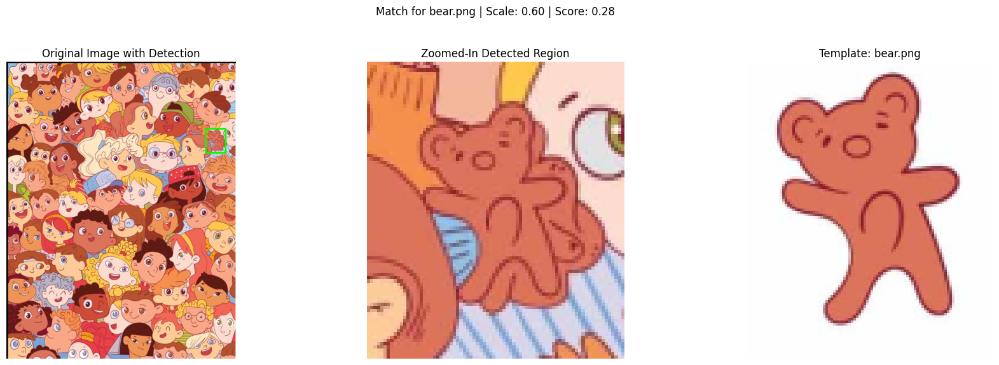

Processing template: watermelon.png


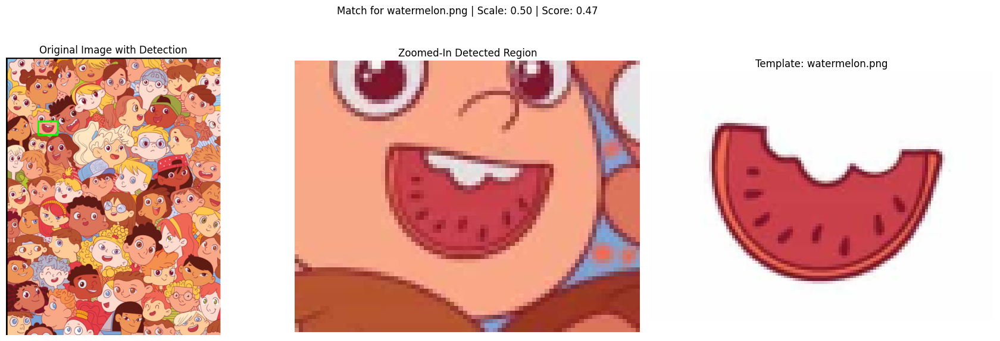

Processing template: ball.png


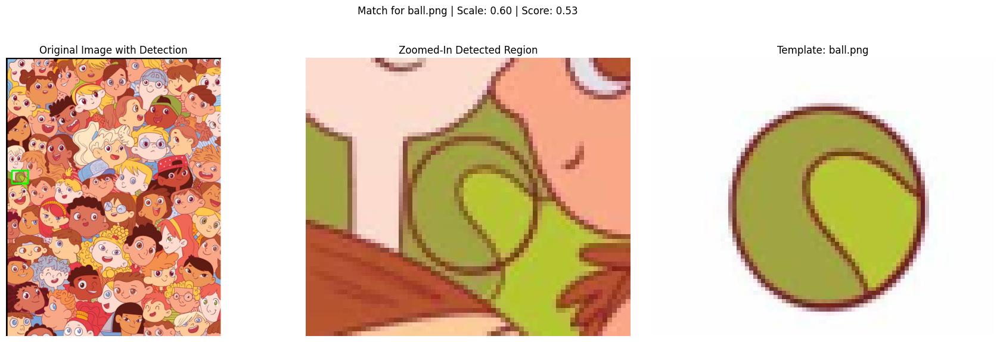

Processing template: bow.png


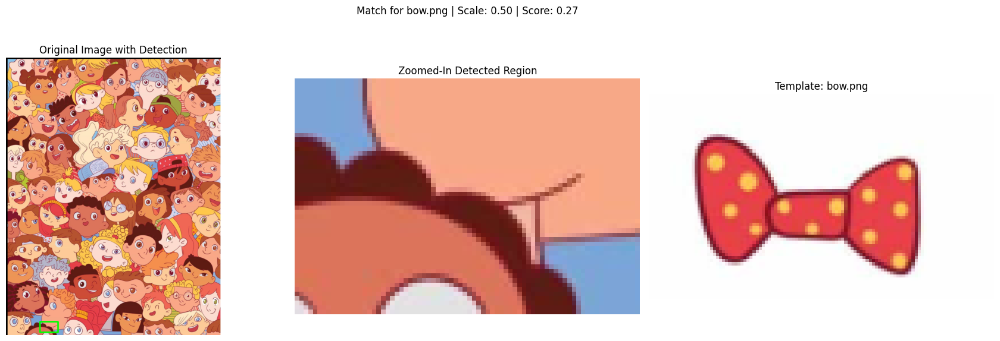

Processing template: cake.png


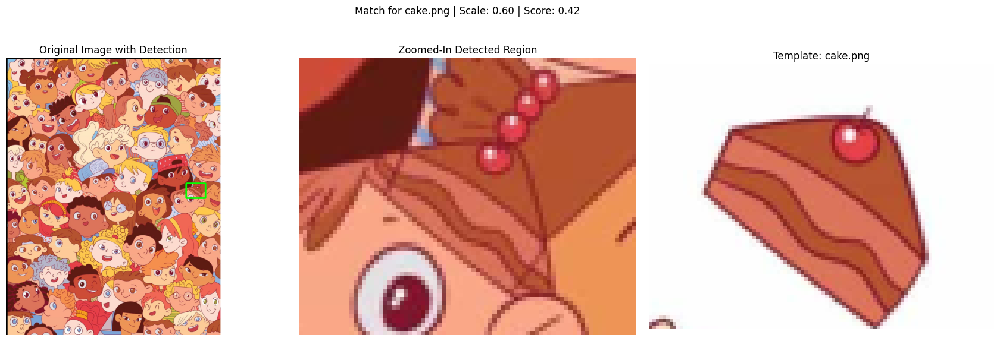

Processing template: boat.png


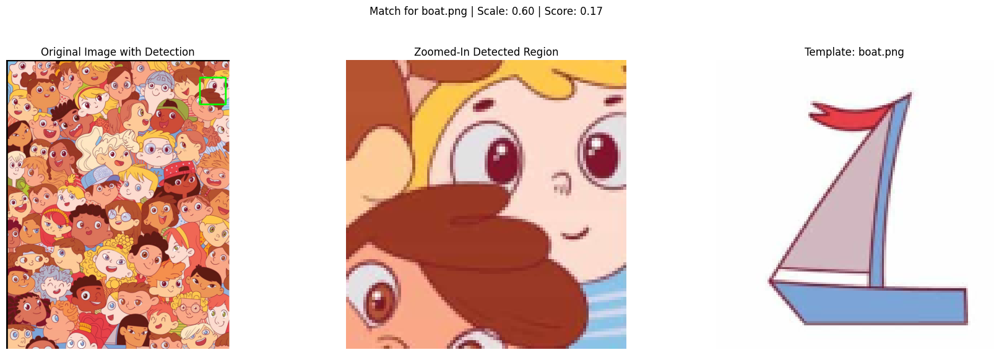

Processing template: grape.png


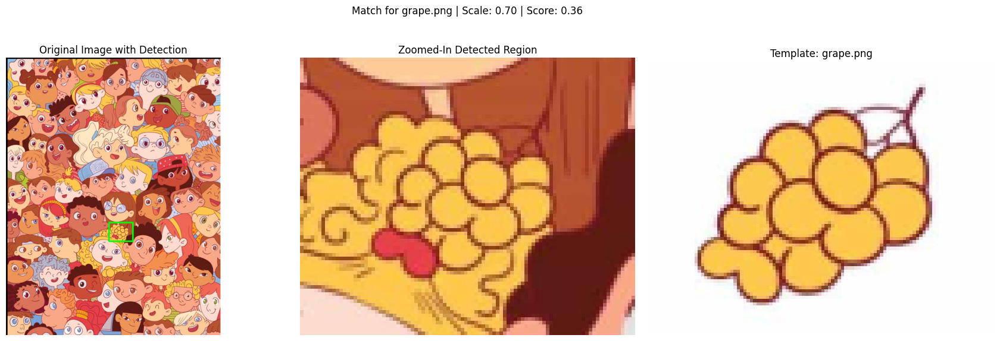

Processing template: balloon.png


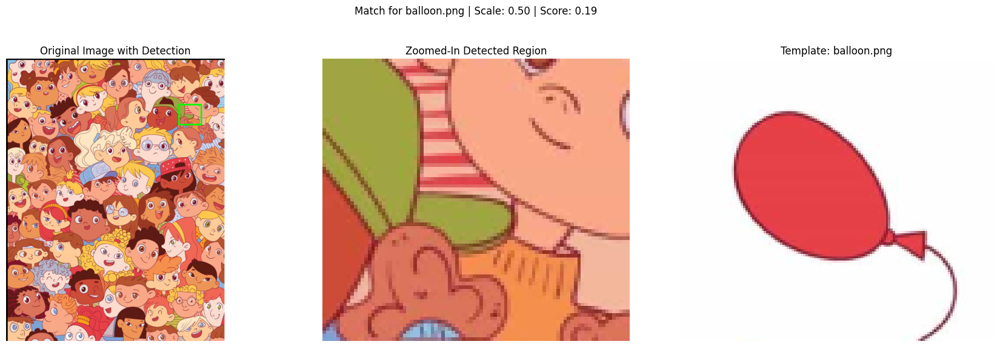

Processing template: tieu_bach_tho.png


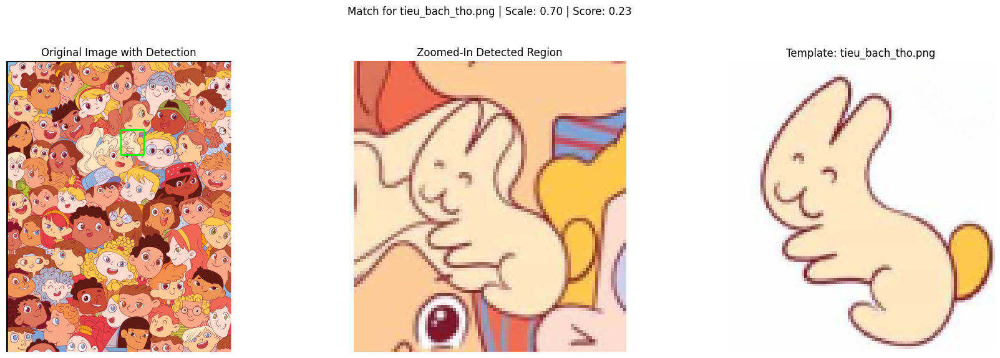

Processing template: strawberry.png


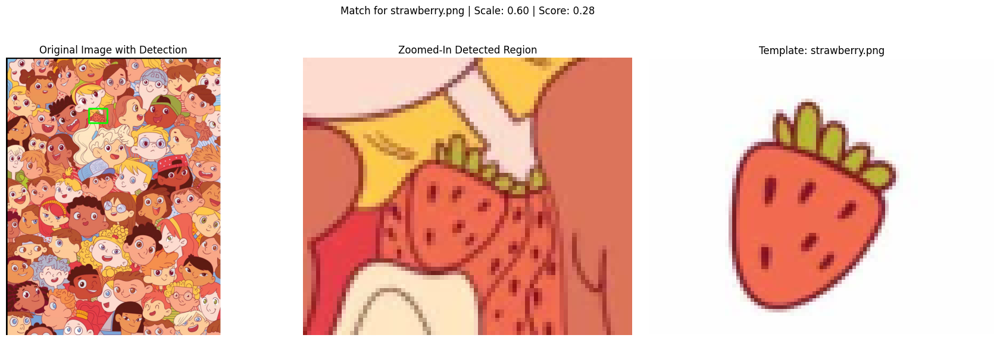

Processing template: truck.png


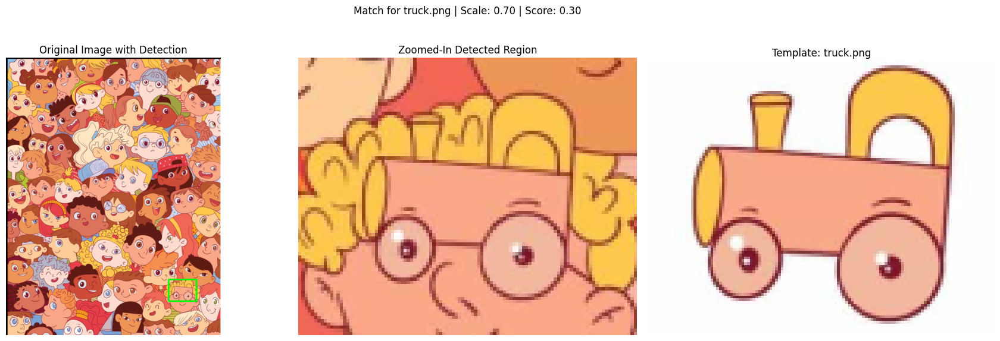

Processing template: ice_cream.png


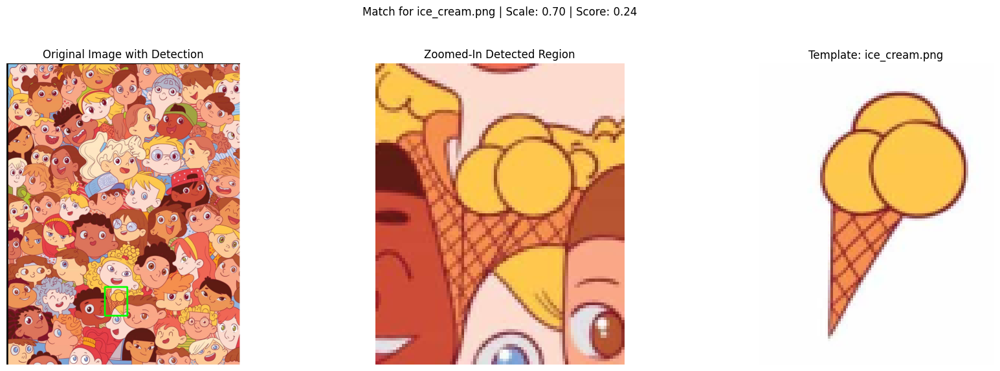

Processing template: pony.png


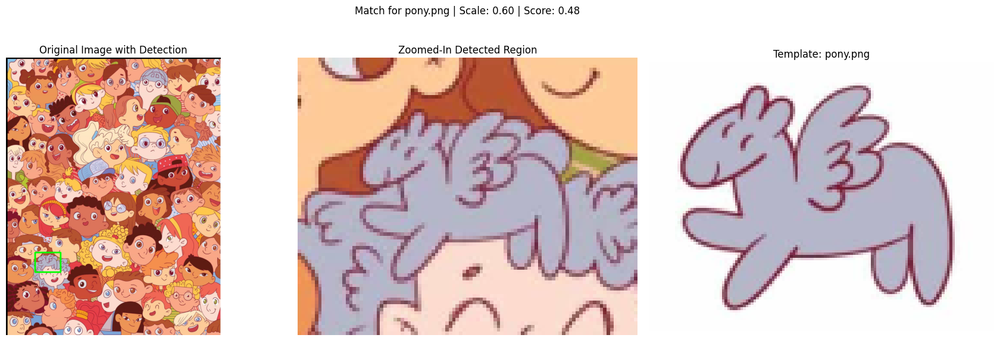

Processing template: car.png


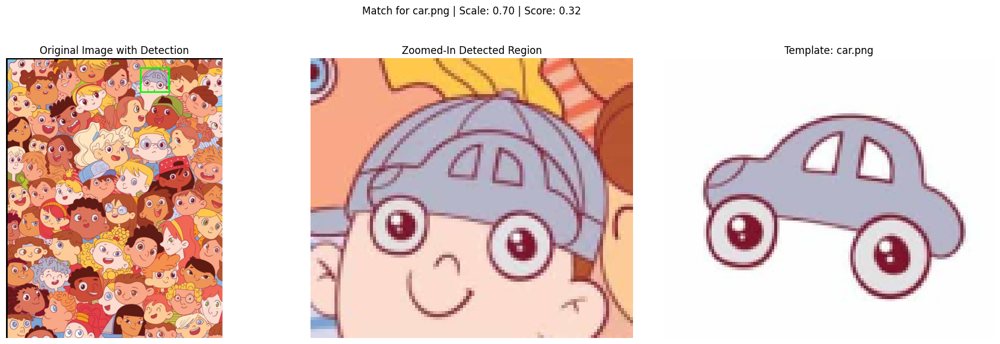

Processing template: duckduckgo.png


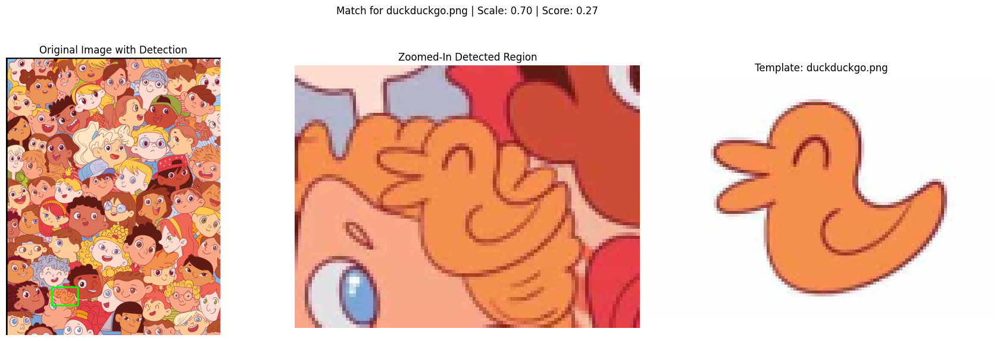

Finished processing all templates!


In [137]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

def sharpen_image(image, c):
    """Applies sharpening to enhance edges."""
    kernel = np.array([[0, -1, 0],
                       [-1, 4 + c, -1],
                       [0, -1, 0]])
    return cv.filter2D(image, -1, kernel)

def adaptive_sharpen_image(image, c=2, blockSize=11, C=2):
    """Applies sharpening followed by adaptive thresholding."""
    sharpened = sharpen_image(image, c)
    return cv.adaptiveThreshold(sharpened, 255, 
                                cv.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                cv.THRESH_BINARY, blockSize, C)

def multi_scale_template_matching(img_gray, template, method, scale_range=(0.5, 1.5), step=0.1):
    h, w = template.shape  # Original template dimensions
    best_match = None
    best_score = float('-inf') if method not in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED] else float('inf')
    best_scale = 1.0

    # Iterate over scales
    for scale in np.arange(scale_range[0], scale_range[1], step):
        resized_template = cv.resize(template, (int(w * scale), int(h * scale)))
        if resized_template.shape[0] > img_gray.shape[0] or resized_template.shape[1] > img_gray.shape[1]:
            continue  # Skip if template becomes larger than image

        # Preprocess both the main image and resized template
        # processed_img = adaptive_sharpen_image(img_gray)
        # processed_template = adaptive_sharpen_image(resized_template)
        processed_img = adaptive_sharpen_image(img_gray)
        processed_template = adaptive_sharpen_image(resized_template)

        # Perform template matching
        res = cv.matchTemplate(processed_img, processed_template, method)
        min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)

        # Determine best match based on method
        match_val = min_val if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED] else max_val
        if (method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED] and match_val < best_score) or \
           (method not in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED] and match_val > best_score):
            best_score = match_val
            best_match = min_loc if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED] else max_loc
            best_scale = scale

    return best_match, best_score, best_scale

if __name__ == '__main__':
    # --- Load Main Image in Color ---
    img_color = cv.imread('main_image.png', cv.IMREAD_COLOR)
    if img_color is None:
        raise ValueError("Could not load main image!")
    # Convert to grayscale for matching
    img_gray = cv.cvtColor(img_color, cv.COLOR_BGR2GRAY)

    # --- Folder containing templates ---
    template_folder = 'template/'  

    # --- Matching Method ---
    method = cv.TM_CCOEFF_NORMED  

    # --- Process Each Template ---
    for filename in os.listdir(template_folder):
        template_path = os.path.join(template_folder, filename)
        # Load template in grayscale for matching
        template_gray = cv.imread(template_path, cv.IMREAD_GRAYSCALE)
        if template_gray is None:
            print(f"Could not read file: {template_path}")
            continue  # Skip if file cannot be read

        # Additionally load the template in color if available
        template_color = cv.imread(template_path, cv.IMREAD_COLOR)
        if template_color is None:
            # If not, convert the grayscale template to BGR
            template_color = cv.cvtColor(template_gray, cv.COLOR_GRAY2BGR)

        print(f"Processing template: {filename}")

        # Perform multi-scale template matching
        best_match, best_score, best_scale = multi_scale_template_matching(img_gray, template_gray, method)
        if best_match is None:
            print(f"No match found for template {filename}")
            continue

        x, y = best_match
        # Compute the scaled dimensions of the template
        w_template = int(template_gray.shape[1] * best_scale)
        h_template = int(template_gray.shape[0] * best_scale)
        bottom_right = (x + w_template, y + h_template)

        # Create a copy of the main image (in color) to draw on
        img_display = img_color.copy()
        # Draw a colored rectangle (red in this case) around the detected region
        cv.rectangle(img_display, (x, y), bottom_right, (0, 255, 0), 3)

        # Define a zoomed-in view with some padding
        pad = 10
        x1 = max(x - pad, 0)
        y1 = max(y - pad, 0)
        x2 = min(x + w_template + pad, img_gray.shape[1])
        y2 = min(y + h_template + pad, img_gray.shape[0])
        zoom_region = img_color[y1:y2, x1:x2]

        # Plot the results in 3 subplots:
        # 1. Original Color Image with the detected region.
        # 2. Zoomed-in view of the detected region.
        # 3. The Template Image.
        fig, axs = plt.subplots(1, 3, figsize=(18, 6))

        axs[0].imshow(cv.cvtColor(img_display, cv.COLOR_BGR2RGB))
        axs[0].set_title('Original Image with Detection')
        axs[0].axis('off')

        axs[1].imshow(cv.cvtColor(zoom_region, cv.COLOR_BGR2RGB))
        axs[1].set_title('Zoomed-In Detected Region')
        axs[1].axis('off')

        axs[2].imshow(cv.cvtColor(template_color, cv.COLOR_BGR2RGB))
        axs[2].set_title(f'Template: {filename}')
        axs[2].axis('off')

        plt.suptitle(f'Match for {filename} | Scale: {best_scale:.2f} | Score: {best_score:.2f}')
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    print("Finished processing all templates!")


# Multi-Scale Template Matching and Color thresholding

Processing template: bow.png
  Cluster 0: Lower bound: [  0 204  81], Upper bound: [ 30 255 255]


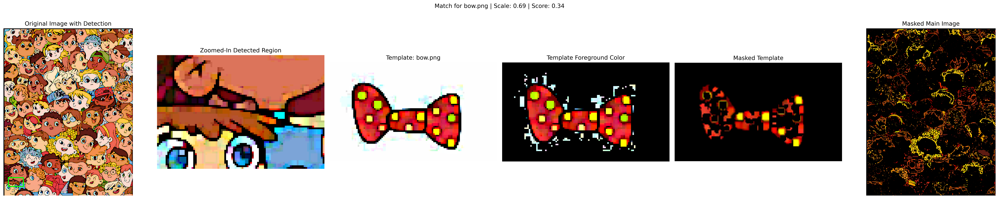

Processing template: boat.png
  Cluster 0: Lower bound: [ 47   9 185], Upper bound: [124 122 255]


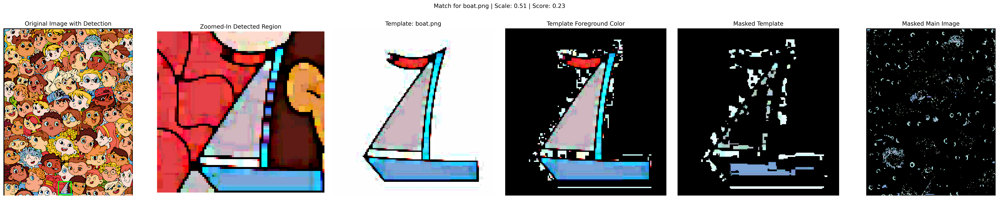

Processing template: balloon.png
  Cluster 0: Lower bound: [172 168 207], Upper bound: [179 209 245]


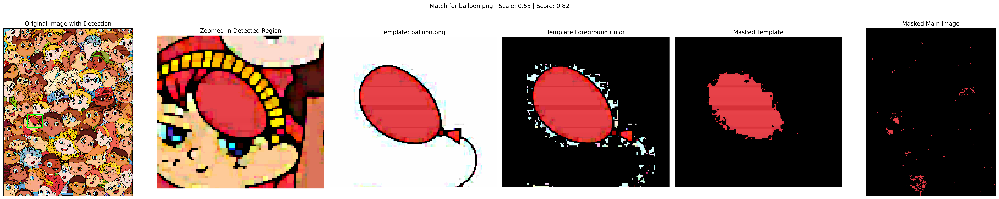

Finished processing all templates!


In [6]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

def color_threshold_image(image, lower_bound, upper_bound):
    hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)
    mask = cv.inRange(hsv, lower_bound, upper_bound)
    return mask

def get_dominant_hsv_bounds(template_color, n_clusters=4, k=1.5, n_most=1,
                            bg_hsv_thresh=([0, 0, 230], [180, 20, 255]),
                            black_v_thresh=50):
    # Convert to HSV and mask background (e.g., nearly white)
    template_hsv = cv.cvtColor(template_color, cv.COLOR_BGR2HSV)
    lower_bg = np.array(bg_hsv_thresh[0])
    upper_bg = np.array(bg_hsv_thresh[1])
    bg_mask = cv.inRange(template_hsv, lower_bg, upper_bg)
    fg_mask = cv.bitwise_not(bg_mask)
    
    # Extract HSV values of foreground pixels
    fg_pixels = template_hsv[fg_mask > 0]
    if fg_pixels.size == 0:
        print("Warning: No foreground pixels detected. Using entire image for clustering.")
        fg_pixels = template_hsv.reshape(-1, 3)
    
    # Convert pixels to float32 for k-means clustering
    fg_pixels = np.float32(fg_pixels)
    
    # Apply k-means clustering to segment the colors
    criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 10, 1.0)
    ret, labels, centers = cv.kmeans(fg_pixels, n_clusters, None, criteria, 10, cv.KMEANS_RANDOM_CENTERS)
    
    # Define valid HSV ranges
    hsv_lower_limits = np.array([0, 0, 0])
    hsv_upper_limits = np.array([179, 255, 255])
    
    # Calculate the size (number of pixels) for each cluster
    cluster_sizes = [np.sum(labels.flatten() == i) for i in range(n_clusters)]
    
    cluster_info = []
    for i in range(n_clusters):
        # Get all pixels belonging to the current cluster
        cluster_pixels = fg_pixels[labels.flatten() == i]
        # Skip clusters that might be too dark or empty
        if cluster_pixels.size == 0 or np.mean(cluster_pixels[:, 2]) < black_v_thresh:
            continue
        
        mean_hsv = np.mean(cluster_pixels, axis=0)
        std_hsv = np.std(cluster_pixels, axis=0)
        
        lower_bound_f = mean_hsv - k * std_hsv
        upper_bound_f = mean_hsv + k * std_hsv
        
        lower_bound = np.maximum(lower_bound_f, hsv_lower_limits).astype(np.uint8)
        upper_bound = np.minimum(upper_bound_f, hsv_upper_limits).astype(np.uint8)
        
        # Append tuple of (cluster size, (lower_bound, upper_bound))
        cluster_info.append((cluster_sizes[i], (lower_bound, upper_bound)))
    
    # If none of the clusters passed the threshold, use all clusters without filtering
    if not cluster_info:
        for i in range(n_clusters):
            cluster_pixels = fg_pixels[labels.flatten() == i]
            mean_hsv = np.mean(cluster_pixels, axis=0)
            std_hsv = np.std(cluster_pixels, axis=0)
            lower_bound_f = mean_hsv - k * std_hsv
            upper_bound_f = mean_hsv + k * std_hsv
            lower_bound = np.maximum(lower_bound_f, hsv_lower_limits).astype(np.uint8)
            upper_bound = np.minimum(upper_bound_f, hsv_upper_limits).astype(np.uint8)
            cluster_info.append((cluster_sizes[i], (lower_bound, upper_bound)))
    
    # Sort clusters by descending number of pixels (dominance)
    cluster_info.sort(key=lambda x: x[0], reverse=True)
    
    # Take only the n_most dominant bounds (if there are fewer clusters than n_most, return all)
    bounds_list = [info[1] for info in cluster_info][:n_most]
    
    return bounds_list, fg_mask




def combine_masks(image, bounds_list):
    """
    For a given image and a list of HSV bounds, this function returns a combined mask.
    """
    combined_mask = np.zeros(image.shape[:2], dtype=np.uint8)
    for (lower, upper) in bounds_list:
        mask = color_threshold_image(image, lower, upper)
        combined_mask = cv.bitwise_or(combined_mask, mask)
    return combined_mask

def multi_scale_template_matching_color(main_img_color, template_color, method,
                                        bounds_list,
                                        scale_range=(0.5, 1.5), step=0.01):
    h, w = template_color.shape[:2]
    best_match = None
    best_score = float('-inf') if method not in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED] else float('inf')
    best_scale = 1.0

    # Create composite masks for main image and template using all bounds
    composite_mask_main = combine_masks(main_img_color, bounds_list)
    masked_main = cv.bitwise_and(main_img_color, main_img_color, mask=composite_mask_main)

    for scale in np.arange(scale_range[0], scale_range[1], step):
        resized_template = cv.resize(template_color, (int(w * scale), int(h * scale)))
        if resized_template.shape[0] > main_img_color.shape[0] or resized_template.shape[1] > main_img_color.shape[1]:
            continue  # Skip if the resized template exceeds main image dimensions

        composite_mask_template = combine_masks(resized_template, bounds_list)
        masked_template = cv.bitwise_and(resized_template, resized_template, mask=composite_mask_template)

        res = cv.matchTemplate(masked_main, masked_template, method)
        min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)

        match_val = min_val if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED] else max_val
        if (method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED] and match_val < best_score) or \
           (method not in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED] and match_val > best_score):
            best_score = match_val
            best_match = min_loc if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED] else max_loc
            best_scale = scale

    return best_match, best_score, best_scale, masked_main, masked_template

def unsharp_mask(image, strength=15, blur_size=(5, 5)):
    blurred = cv.GaussianBlur(image, blur_size, 0)
    sharpened = cv.addWeighted(image, 1 + strength, blurred, -strength, 0)
    return sharpened


def open_image(image, kernel_size=3):
    kernel = cv.getStructuringElement(cv.MORPH_RECT, (kernel_size, kernel_size))
    return cv.morphologyEx(image, cv.MORPH_OPEN, kernel)


if __name__ == '__main__':
    # Load Main Image in Color
    img_color = cv.imread('main_image.png', cv.IMREAD_COLOR)
    if img_color is None:
        raise ValueError("Could not load main image!")
    
    img_color = unsharp_mask(img_color)
    img_color = open_image(img_color)

    # Folder containing templates
    template_folder = 'template/'

    # Matching Method (you can experiment with different methods)
    method = cv.TM_CCOEFF_NORMED

    # Process selected templates
    for filename in ["bow.png", "boat.png", "balloon.png"]:
        template_path = os.path.join(template_folder, filename)
        template_color = cv.imread(template_path, cv.IMREAD_COLOR)
        if template_color is None:
            print(f"Could not read file: {template_path}")
            continue

        print(f"Processing template: {filename}")

        template_color = unsharp_mask(template_color)
        template_color = open_image(template_color)

        # Compute the three dominant HSV bounds using clustering on the template.
        bounds_list, foreground_mask = get_dominant_hsv_bounds(
            template_color, n_clusters=4, k=1.5, n_most=1)
        
        if foreground_mask is None:
            print(f"  Template {filename} has no detectable foreground with current background threshold.")
        
        for idx, (lower_bound, upper_bound) in enumerate(bounds_list):
            print(f"  Cluster {idx}: Lower bound: {lower_bound}, Upper bound: {upper_bound}")

        best_match, best_score, best_scale, masked_main, masked_template = multi_scale_template_matching_color(
            img_color, template_color, method, bounds_list)

        if best_match is None:
            print(f"No match found for template {filename}")
            continue

        x, y = best_match
        w_template = int(template_color.shape[1] * best_scale)
        h_template = int(template_color.shape[0] * best_scale)
        bottom_right = (x + w_template, y + h_template)

        # Create a copy of the main image to draw the detection.
        img_display = img_color.copy()
        cv.rectangle(img_display, (x, y), bottom_right, (0, 255, 0), 3)

        pad = 10
        x1 = max(x - pad, 0)
        y1 = max(y - pad, 0)
        x2 = min(x + w_template + pad, img_color.shape[1])
        y2 = min(y + h_template + pad, img_color.shape[0])
        zoom_region = img_color[y1:y2, x1:x2]
        
        # Create template foreground color image for display using the original foreground mask
        template_foreground_color = cv.bitwise_and(template_color, template_color, mask=foreground_mask)

        # Plot the results in 6 subplots
        fig, axs = plt.subplots(1, 6, figsize=(30, 6))
        axs[0].imshow(cv.cvtColor(img_display, cv.COLOR_BGR2RGB), interpolation='nearest')
        axs[0].set_title('Original Image with Detection')
        axs[0].axis('off')

        axs[1].imshow(cv.cvtColor(zoom_region, cv.COLOR_BGR2RGB), interpolation='nearest')
        axs[1].set_title('Zoomed-In Detected Region')
        axs[1].axis('off')

        axs[2].imshow(cv.cvtColor(template_color, cv.COLOR_BGR2RGB), interpolation='nearest')
        axs[2].set_title(f'Template: {filename}')
        axs[2].axis('off')

        axs[3].imshow(cv.cvtColor(template_foreground_color, cv.COLOR_BGR2RGB), interpolation='nearest')
        axs[3].set_title('Template Foreground Color')
        axs[3].axis('off')

        axs[4].imshow(cv.cvtColor(masked_template, cv.COLOR_BGR2RGB), interpolation='nearest')
        axs[4].set_title('Masked Template')
        axs[4].axis('off')

        axs[5].imshow(cv.cvtColor(masked_main, cv.COLOR_BGR2RGB), interpolation='nearest')
        axs[5].set_title('Masked Main Image')
        axs[5].axis('off')

        plt.suptitle(f'Match for {filename} | Scale: {best_scale:.2f} | Score: {best_score:.2f}')
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.gcf().set_dpi(500)
        plt.show()

    print("Finished processing all templates!")


# Edge-Based Multi-Scale Template Matching


Processing template: bow.png
  Searching scales from 0.40 to 1.20...


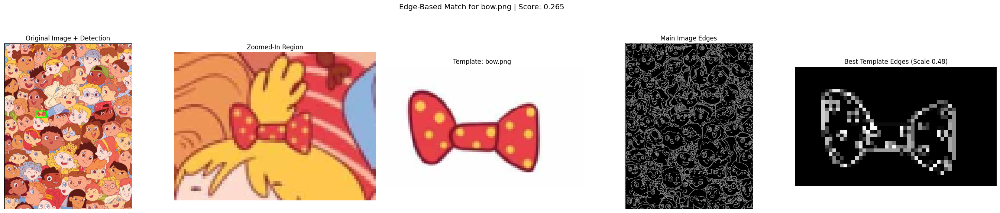


Processing template: boat.png
  Searching scales from 0.40 to 1.20...


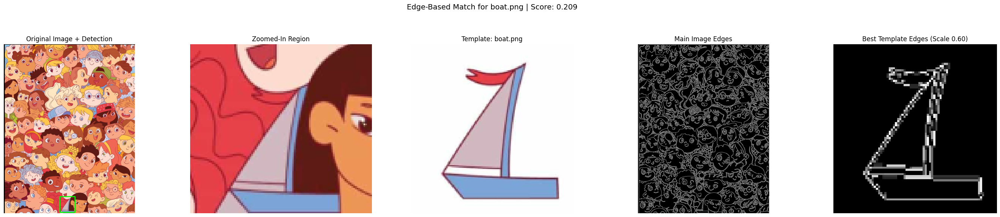


Processing template: balloon.png
  Searching scales from 0.40 to 1.20...


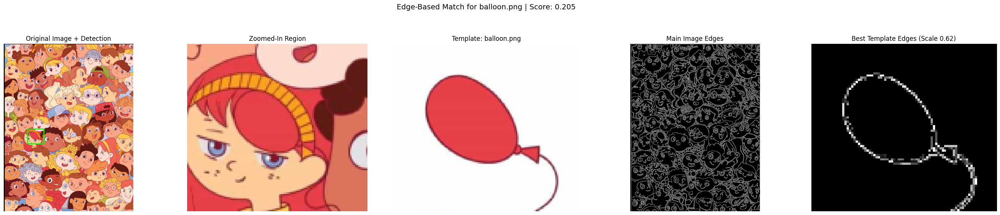


Finished processing selected templates.


In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

def multi_scale_template_matching_edge_based(main_img, template, method=cv.TM_CCOEFF_NORMED,
                                             scale_range=(0.5, 1.5), step=0.01,
                                             canny_thresh1=50, canny_thresh2=150):
    # Convert images to grayscale
    main_gray = cv.cvtColor(main_img, cv.COLOR_BGR2GRAY)
    template_gray = cv.cvtColor(template, cv.COLOR_BGR2GRAY)

    # Compute edge maps using Canny edge detector
    main_edges = cv.Canny(main_gray, canny_thresh1, canny_thresh2)
    template_edges = cv.Canny(template_gray, canny_thresh1, canny_thresh2)

    # Get dimensions of the original template edge image
    h, w = template_edges.shape[:2]

    best_match = None
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        best_score = float('inf')
    else:
        best_score = float('-inf')
    best_scale = 1.0
    # Initialize best_template_edges with the original template edges
    # This ensures we return something even if no scaled match is better
    best_template_edges = template_edges.copy()

    print(f"  Searching scales from {scale_range[0]:.2f} to {scale_range[1]:.2f}...")
    # Loop over scales
    for scale in np.arange(scale_range[0], scale_range[1], step):
        # Calculate new dimensions
        new_w, new_h = int(w * scale), int(h * scale)
        # Ensure dimensions are at least 1 pixel
        if new_w < 1 or new_h < 1:
            continue

        # Resize the original template edges for the current scale
        resized_template_edges = cv.resize(template_edges, (new_w, new_h), interpolation=cv.INTER_LINEAR)

        # Skip if resized template is larger than the main edge map
        if resized_template_edges.shape[0] > main_edges.shape[0] or resized_template_edges.shape[1] > main_edges.shape[1]:
            # If scales are increasing, we can stop early
            if step > 0:
                 # print(f"  Template scale {scale:.2f} too large, stopping search.")
                 break # Stop searching larger scales
            else:
                 continue # Continue if scales might decrease later

        # Perform template matching
        try:
            res = cv.matchTemplate(main_edges, resized_template_edges, method)
        except cv.error as e:
            print(f"  Skipping scale {scale:.2f}: OpenCV error - {e}")
            continue # Skip scale if matching fails (e.g., template too small)

        min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)

        # Determine match score and location based on matching method
        if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
            match_val = min_val
            match_loc = min_loc
            improved = match_val < best_score
        else:
            match_val = max_val
            match_loc = max_loc
            improved = match_val > best_score

        # Update best match if current scale is better
        if improved:
            best_score = match_val
            best_match = match_loc
            best_scale = scale
            # Store the successfully matched scaled edge map
            best_template_edges = resized_template_edges.copy()

    if best_match is None:
        print("  No suitable match found across scales.")

    # Return the main edges and the best *scaled* template edges found
    return best_match, best_score, best_scale, main_edges, best_template_edges

# --- Main Execution ---
if __name__ == '__main__':
    # Load the main image (color)
    main_image_path = 'main_image.png'
    img_color = cv.imread(main_image_path, cv.IMREAD_COLOR)
    if img_color is None:
        raise ValueError(f"Could not load main image: {main_image_path}")

    # Specify the folder and list of template filenames
    template_folder = 'template'
    template_files = ["bow.png", "boat.png", "balloon.png"] # Add more templates if needed

    # Choose the matching method (TM_CCOEFF_NORMED is generally robust)
    method = cv.TM_CCOEFF_NORMED
    # Define Canny thresholds (these might need tuning based on images)
    canny_thresh1 = 50
    canny_thresh2 = 150

    # --- Loop Through Templates ---
    for filename in template_files:
        template_path = os.path.join(template_folder, filename)
        template_color = cv.imread(template_path, cv.IMREAD_COLOR)
        if template_color is None:
            print(f"Could not load template image: {template_path}")
            continue

        print(f"\nProcessing template: {filename}")

        # Perform multi-scale template matching using the edge-based function
        # Capture all returned values, including the edge maps
        best_match, best_score, best_scale, main_edges, best_template_edges = \
            multi_scale_template_matching_edge_based(
                img_color, template_color, method=method,
                scale_range=(0.4, 1.2), # Adjusted scale range example
                step=0.02,             # Adjusted step example
                canny_thresh1=canny_thresh1,
                canny_thresh2=canny_thresh2
            )

        # --- Process and Visualize Results ---
        if best_match is None:
            print(f"  No match found for template {filename}")
            continue # Skip to the next template

        # Get coordinates and dimensions
        x, y = best_match
        # Use original template dimensions to calculate bounding box size at best scale
        h_orig, w_orig = template_color.shape[:2]
        w_template_scaled = int(w_orig * best_scale)
        h_template_scaled = int(h_orig * best_scale)
        bottom_right = (x + w_template_scaled, y + h_template_scaled)

        # --- Drawing and Zooming ---
        # Create a copy of the main image to draw on
        img_display = img_color.copy()
        # Draw a colored rectangle (green) around the detected region
        cv.rectangle(img_display, (x, y), bottom_right, (0, 255, 0), 3) # Increased thickness

        # Define a zoomed-in view with padding
        pad = 15 # Increased padding
        x1 = max(x - pad, 0)
        y1 = max(y - pad, 0)
        # Use main image dimensions for bounds checking
        x2 = min(x + w_template_scaled + pad, img_color.shape[1])
        y2 = min(y + h_template_scaled + pad, img_color.shape[0])
        zoom_region = img_color[y1:y2, x1:x2]

        # --- Plotting ---
        # Create 5 subplots in a single row
        fig, axs = plt.subplots(1, 5, figsize=(28, 6)) # Adjusted figsize

        # 1. Original Image with Detection
        axs[0].imshow(cv.cvtColor(img_display, cv.COLOR_BGR2RGB))
        axs[0].set_title('Original Image + Detection')
        axs[0].axis('off')

        # 2. Zoomed-In Detected Region
        if zoom_region.size > 0: # Check if zoom region is valid
            axs[1].imshow(cv.cvtColor(zoom_region, cv.COLOR_BGR2RGB))
            axs[1].set_title('Zoomed-In Region')
        else:
            axs[1].text(0.5, 0.5, 'Zoom Invalid', ha='center', va='center')
            axs[1].set_title('Zoomed-In Region')
        axs[1].axis('off')

        # 3. Original Template Image
        axs[2].imshow(cv.cvtColor(template_color, cv.COLOR_BGR2RGB))
        axs[2].set_title(f'Template: {filename}')
        axs[2].axis('off')

        # 4. Main Image Canny Edges
        axs[3].imshow(main_edges, cmap='gray')
        axs[3].set_title('Main Image Edges')
        axs[3].axis('off')

        # 5. Best Scaled Template Canny Edges
        if best_template_edges.size > 0: # Check if edges exist
             axs[4].imshow(best_template_edges, cmap='gray')
             axs[4].set_title(f'Best Template Edges (Scale {best_scale:.2f})')
        else:
             axs[4].text(0.5, 0.5, 'Edges Invalid', ha='center', va='center')
             axs[4].set_title('Best Template Edges')
        axs[4].axis('off')

        # Add overall title
        plt.suptitle(f'Edge-Based Match for {filename} | Score: {best_score:.3f}', fontsize=14) # More score precision
        # Adjust layout
        plt.tight_layout(rect=[0, 0.03, 1, 0.92]) # Adjust top margin for suptitle
        plt.show()

    print("\nFinished processing selected templates.")